In [4]:
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import tables
from random import shuffle
from IPython.display import clear_output
from sklearn import metrics
from tqdm import tqdm
import time
import seaborn as sns
%matplotlib inline

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [5]:
np.sqrt(1300)

36.05551275463989

In [7]:
np.sqrt(0.089)

0.29832867780352595

In [6]:
130030.3 /100

1300.303

In [2]:
#import ROOT
#import rootpy
#import root_numpy
#import uproot

## Detector

![title](img/juno.png)

![title](img/juno2.png)

More:
http://juno.ihep.cas.cn/ATEjuno/201309/t20130912_109433.html

## Data description

lpmt — большие ФЭУ, spmt — маленькие,
hits — зарегистрированные фото-электроны (не все фотоны выбивают фото-электрон, и не всякий фото-электрон регистрируется)
Каждый hit имеет 3 характеристики: номер ФЭУ (pmtID), время от физического события в детекторе (hitTime) и происхождение (isDN=0 для нормальных хитов, isDN=1 для шума в самих ФЭУ).

В каждом физическом событии может быть переменное количество хитов. Количество хитов сохранено в переменной nHits. Технически nHits — это длина массивов pmtID, hitTime и isDN в каждом событии.

В true_info записаны данные, которые нельзя напрямую измерить, но можно предсказывать: E — энергия в МэВ; x,y,z,R — координаты в мм (R^2 = x^2+y^2+z^2). События в деревьях соответствуют друг другу по порядковому номеру: певрое из true_info соответствует первому из lpmt_hits и первому из spmt_hits.

lpmt_pos и spmt_pos — это координаты ФЭУ (x, y, z в миллиметрах).

## Goals

* Классификация шумовых событий и реальных, т.к. ФЭУ могут срабатывать случайно
* Восстановление энергии или положения

## Exploratory Data Analysis

In [1]:
import pandas as pd

In [ ]:
DATA_DIR = '/storage/home/vprov/JUNO/JUNO_students/data/'
lpmt_hits = pd.read_hdf(DATA_DIR + 'train/train_lpmt_hits.h5', mode='r', stop=1000) 
lpmt_hits.shape

In [7]:
pd.__version__

'0.23.4'

In [6]:
pd.read_csv(DATA_DIR + 'train/train_lpmt_hits.h5')

TypeError: parser_f() got an unexpected keyword argument 'mode'

In [6]:
# Большие датчики
lpmt_hits.head()

,event,hitTime,isDN,pmtID
0,0,249.992615,False,14175
1,0,40.010311,False,17319
2,0,162.123199,False,16882
3,0,51.875614,False,14951
4,0,79.817497,False,10947


In [7]:
#Маленькие датчики
spmt_hits = pd.read_hdf(DATA_DIR + 'train/train_spmt_hits.h5', mode='r', stop=1000)
spmt_hits.shape

(2314146, 4)

In [ ]:
spmt_hist()

In [8]:
spmt_hits.head()

,event,hitTime,isDN,pmtID
0,0,238.278091,False,311819
1,0,103.316055,False,307244
2,0,108.034225,False,323230
3,0,36.505154,False,320568
4,0,34.109840,False,316487


In [11]:
train = pd.read_csv(DATA_DIR + 'train/train_info.csv')

In [13]:
train.shape

(10000, 6)

In [14]:
true_info = pd.read_csv(DATA_DIR +'train/train_info.csv') 
true_info.shape

(10000, 6)

In [15]:
true_info.head()

,E,R,evtID,x,y,z
0,4.747791,14610.378,0,8290.7790,11995.6180,911.74286
1,3.919721,14630.141,1,11397.6320,5407.4497,-7409.08200
2,3.765940,16820.080,3,-2377.9307,-16317.7020,3315.59030
3,3.217473,13026.938,4,-8617.1170,868.5116,9730.98600
4,7.360527,15190.775,5,4050.2210,9521.7620,11121.66500


In [41]:
true_info[['E', 'x', 'y', 'z']][:3]

,E,x,y,z
0,4.747791,8290.7790,11995.6180,911.74286
1,3.919721,11397.6320,5407.4497,-7409.08200
2,3.765940,-2377.9307,-16317.7020,3315.59030


In [17]:
lpmt_pos = pd.read_csv(DATA_DIR +'train/lpmt_pos.csv') 
lpmt_pos.shape

(17739, 4)

In [18]:
lpmt_pos.head()

,pmt_id,pmt_x,pmt_y,pmt_z
0,0,1.049021e+03,0.0000,19171.32
1,1,9.084785e+02,524.5103,19171.32
2,2,5.245103e+02,908.4785,19171.32
3,3,6.423399e-14,1049.0206,19171.32
4,4,-5.245103e+02,908.4785,19171.32


In [37]:
len(lpmt_pos.pmt_id.unique())

17739

In [19]:
spmt_pos = pd.read_csv(DATA_DIR +'train/spmt_pos.csv') 
spmt_pos.shape

(24952, 4)

In [38]:
len(spmt_pos.pmt_id.unique())

24952

In [20]:
spmt_pos.head()

,pmt_id,pmt_x,pmt_y,pmt_z
0,300000,1.384810e+03,244.17944,19148.438
1,300001,1.217782e+03,703.08670,19148.438
2,300002,9.038709e+02,1077.19130,19148.438
3,300003,4.809396e+02,1321.37070,19148.438
4,300004,8.610328e-14,1406.17330,19148.438


In [21]:
event_id = 10000
lpmt_event_hits = lpmt_hits.loc[lpmt_hits['event'] == event_id]
spmt_event_hits = spmt_hits.loc[spmt_hits['event'] == event_id]

In [22]:
lpmt_hits_values = lpmt_event_hits['pmtID'].values
spmt_hits_values = spmt_event_hits['pmtID'].values

In [23]:
lpmt_hits_mask = []
for t in lpmt_pos.itertuples():
    if t[1] in lpmt_hits_values:
        lpmt_hits_mask.append("g")
    else:
        lpmt_hits_mask.append("r")
        
spmt_hits_mask = []
for t in spmt_pos.itertuples():
    if t[1] in spmt_hits_values:
        spmt_hits_mask.append("g")
    else:
        spmt_hits_mask.append("r")

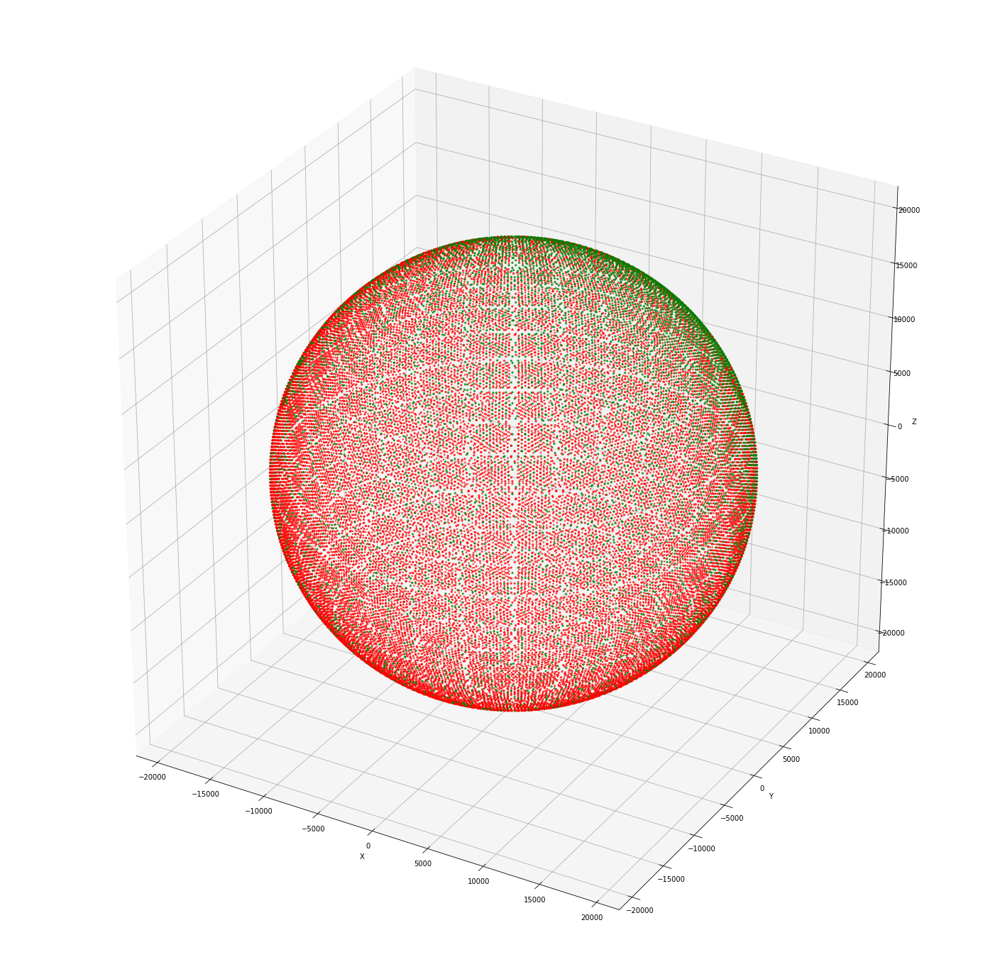

In [24]:
fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')

x = lpmt_pos['pmt_x']
y = lpmt_pos['pmt_y']
z = lpmt_pos['pmt_z']

ax.scatter(x, y, z, c=lpmt_hits_mask, marker='o', s=5, alpha=0.7)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

x = spmt_pos['pmt_x']
y = spmt_pos['pmt_y']
z = spmt_pos['pmt_z']

ax.scatter(x, y, z, c=spmt_hits_mask, marker='o', s=2, alpha=0.7)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

### Signal without DN

In [25]:
lpmt_event_hits_without_DN = lpmt_event_hits.loc[lpmt_event_hits['isDN'] == False]
spmt_event_hits_without_DN = spmt_event_hits.loc[spmt_event_hits['isDN'] == False]

In [26]:
lpmt_hits_values2 = lpmt_event_hits_without_DN['pmtID'].values
spmt_hits_values2 = lpmt_event_hits_without_DN['pmtID'].values

In [27]:
lpmt_hits_mask2 = []
for t in lpmt_pos.itertuples():
    if t[1] in lpmt_hits_values2:
        lpmt_hits_mask2.append("g")
    else:
        lpmt_hits_mask2.append("r")
        
spmt_hits_mask2 = []
for t in spmt_pos.itertuples():
    if t[1] in spmt_hits_values2:
        spmt_hit_mask2.append("g")
    else:
        spmt_hits_mask2.append("r")

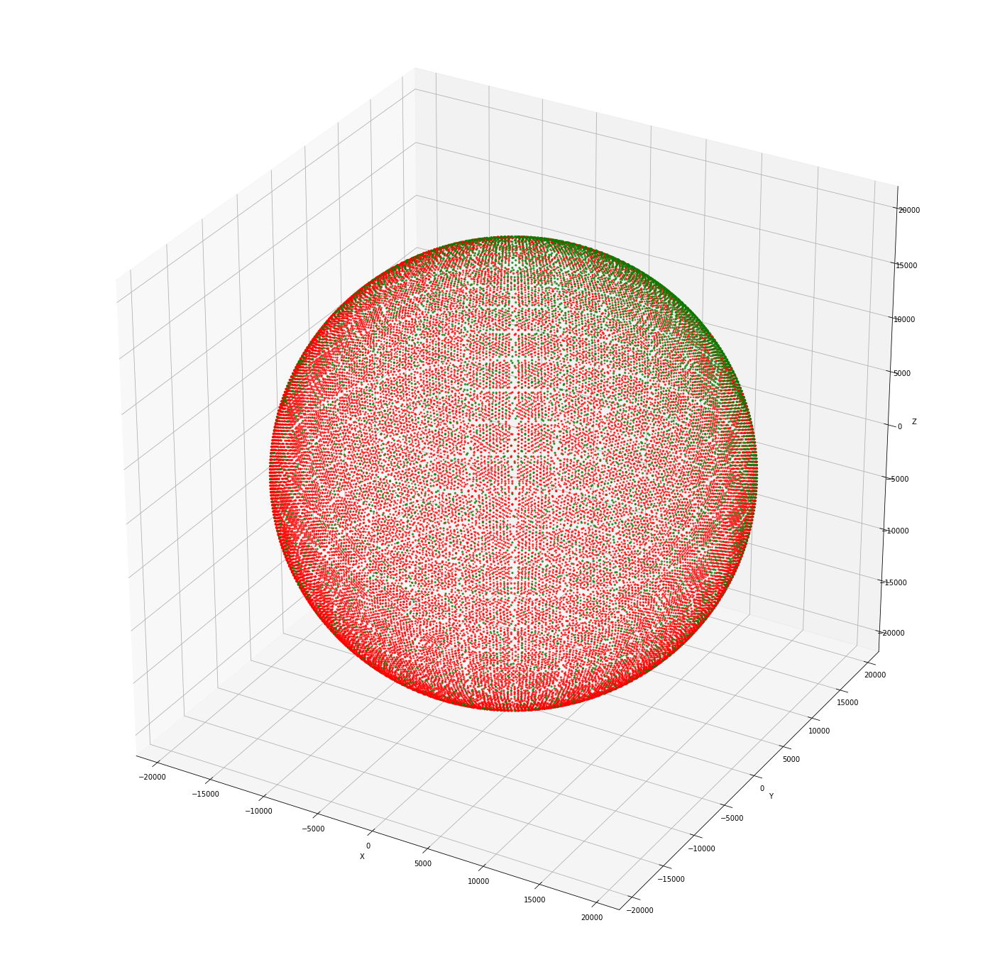

In [28]:
fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')

x = lpmt_pos['pmt_x']
y = lpmt_pos['pmt_y']
z = lpmt_pos['pmt_z']

ax.scatter(x, y, z, c=lpmt_hits_mask2, marker='o', s=5, alpha=0.7)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

x = spmt_pos['pmt_x']
y = spmt_pos['pmt_y']
z = spmt_pos['pmt_z']

ax.scatter(x, y, z, c=spmt_hits_mask2, marker='o', s=2, alpha=0.7)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

### Only signal

In [29]:
x = []
y = []
z = []
for t in lpmt_pos.itertuples():
    if t[1] in lpmt_hits_values2:
        x.append(t[2])
        y.append(t[3])
        z.append(t[4])
        
for t in spmt_pos.itertuples():
    if t[1] in spmt_hits_values2:
        x.append(t[2])
        y.append(t[3])
        z.append(t[4])

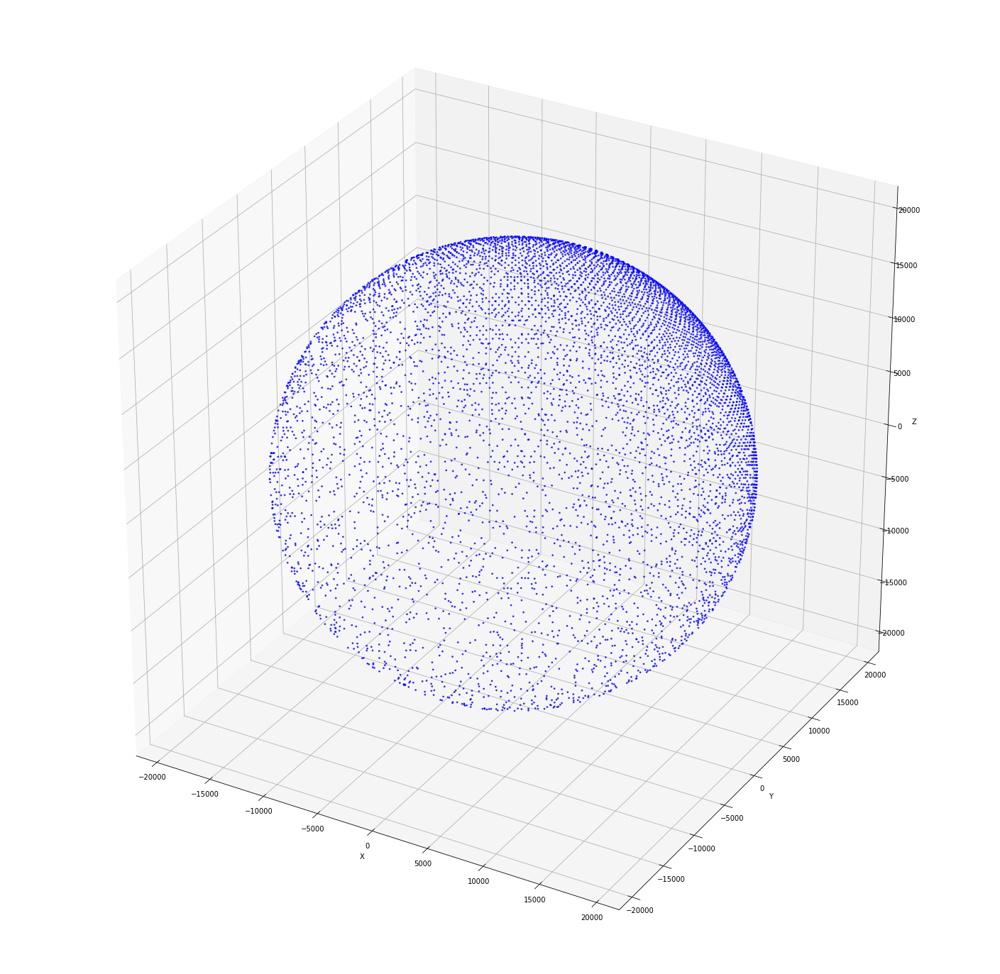

In [30]:
fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z, c='b', marker='o', s=3, alpha=0.7)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

### Signal by time

In [31]:
lpmt_time = lpmt_event_hits_without_DN['hitTime'].values
print(min(lpmt_time))
print(max(lpmt_time))

18.51124
889.8253


In [32]:
spmt_time = spmt_event_hits_without_DN['hitTime'].values
print(min(spmt_time))
print(max(spmt_time))

19.61353
415.14053


In [33]:
n = 20
time_ints = np.linspace(min(lpmt_time), max(lpmt_time), num=n) 
time_ints 

array([ 18.51124001,  64.36987566, 110.22851131, 156.08714696,
       201.94578261, 247.80441826, 293.66305391, 339.52168957,
       385.38032522, 431.23896087, 477.09759652, 522.95623217,
       568.81486782, 614.67350347, 660.53213913, 706.39077478,
       752.24941043, 798.10804608, 843.96668173, 889.82531738])

In [34]:
true_event = true_info[true_info['evtID'] == event_id][['x', 'y', 'z']].values[0]

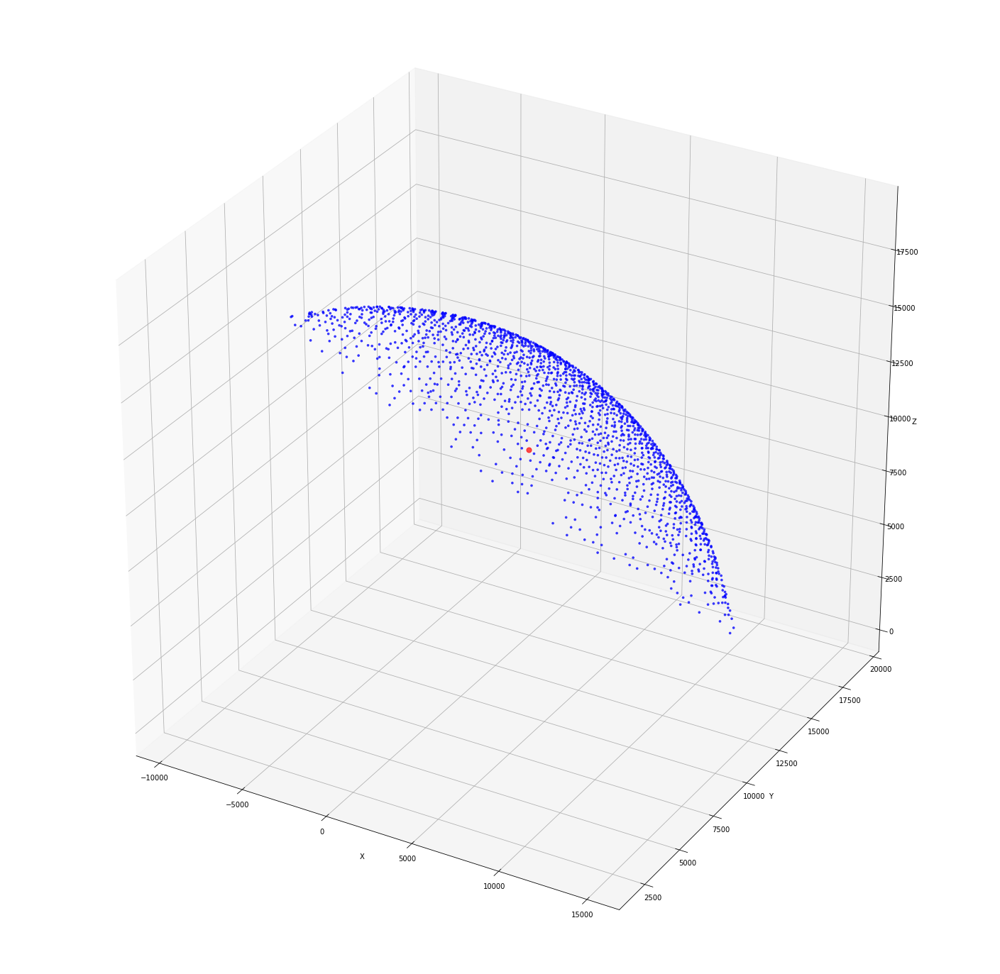

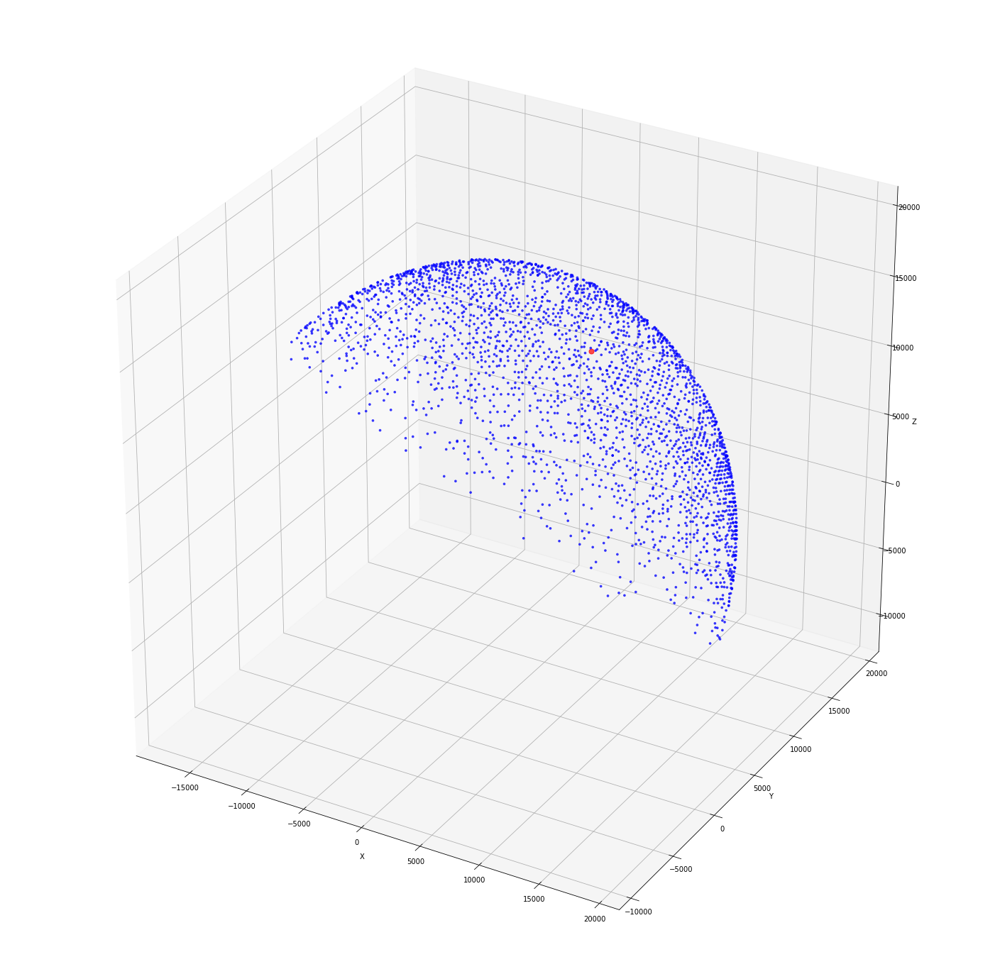

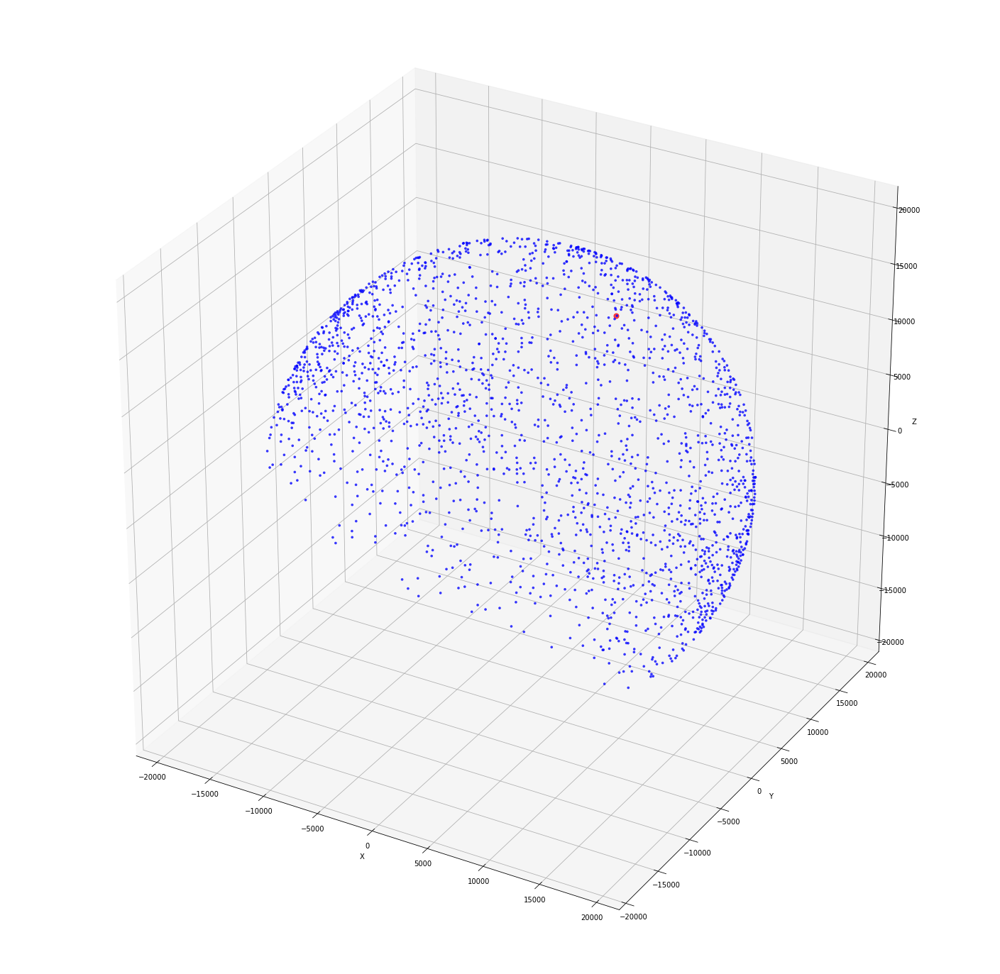

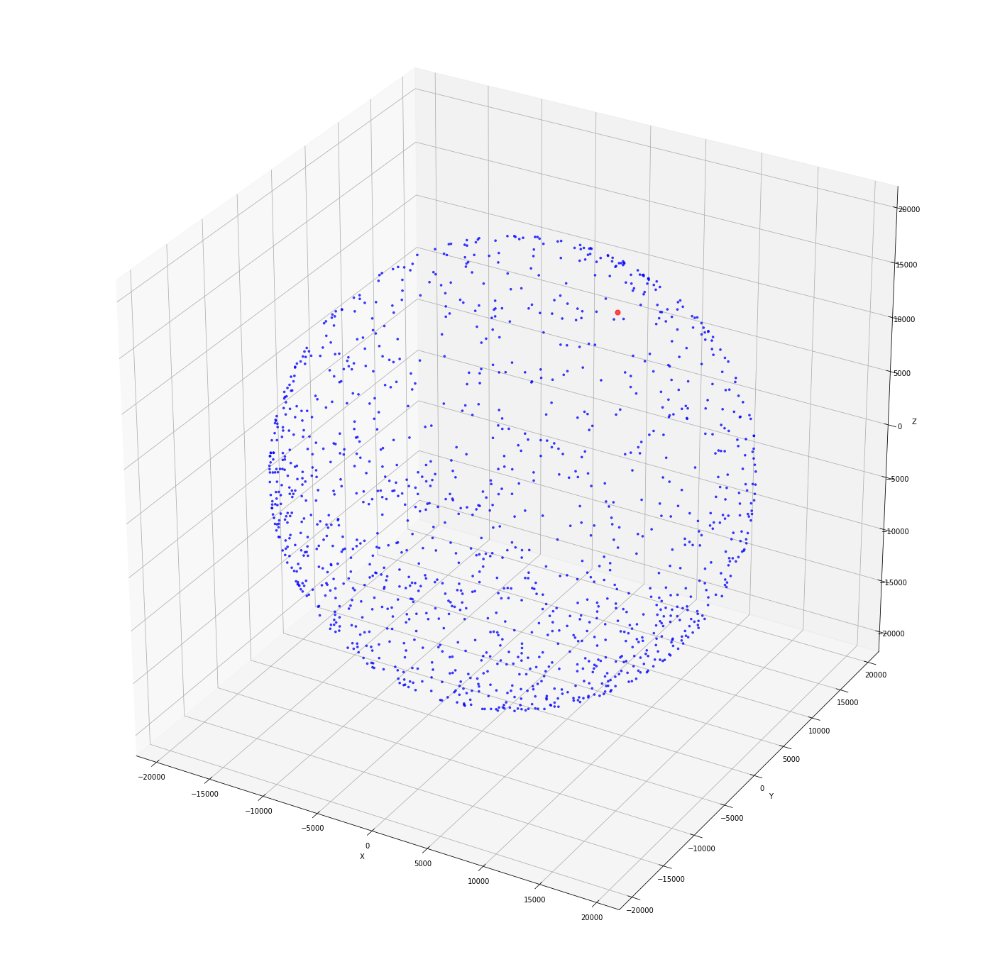

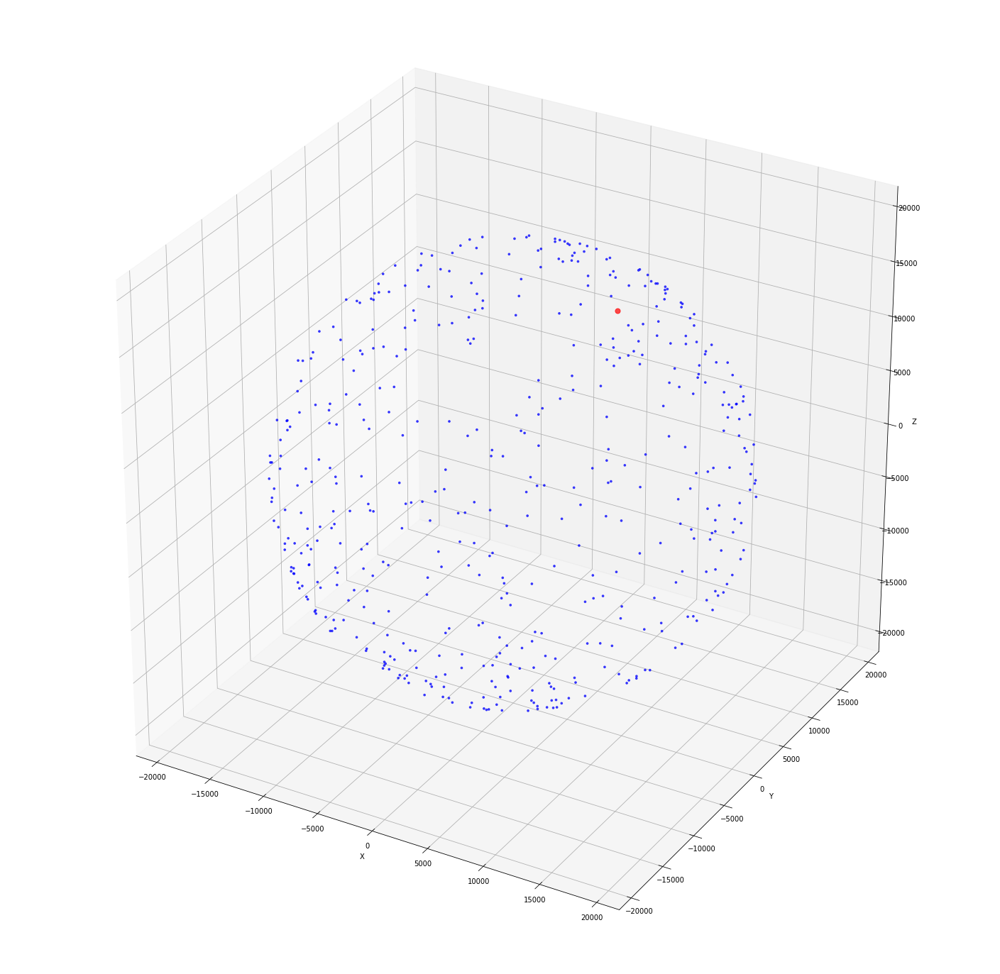

...

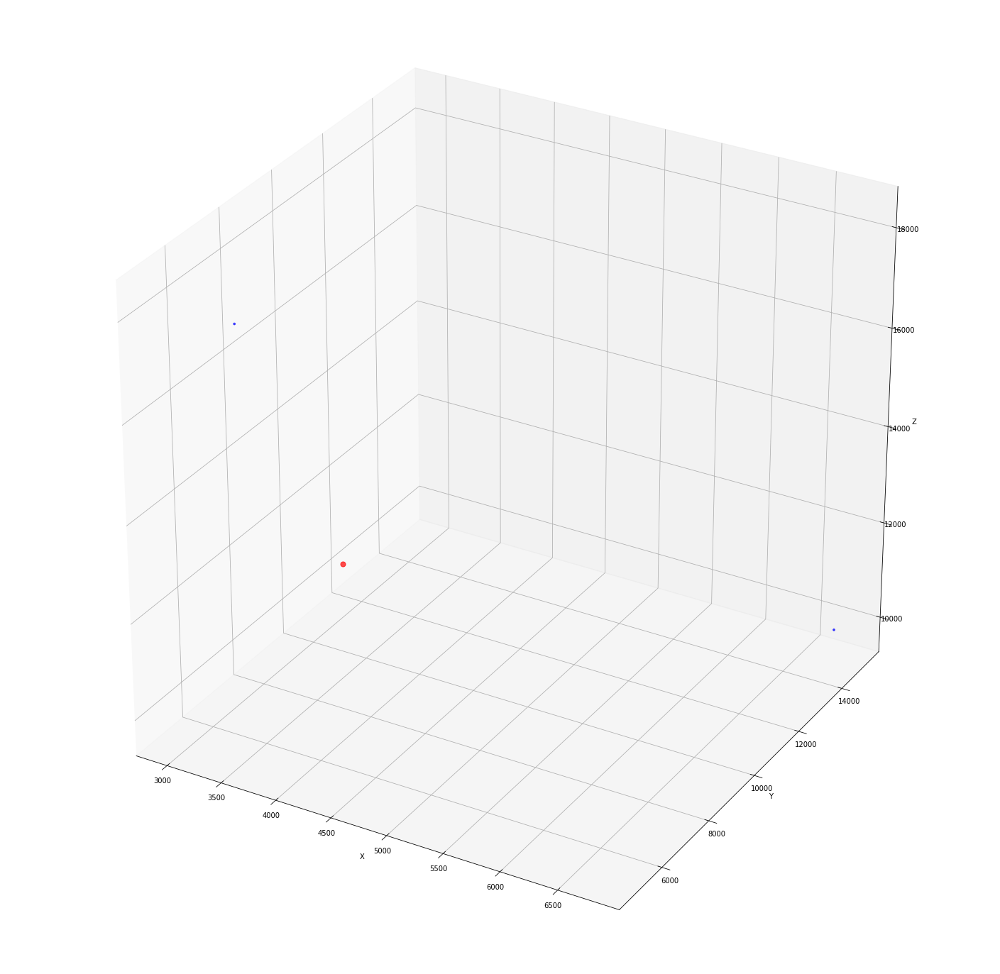

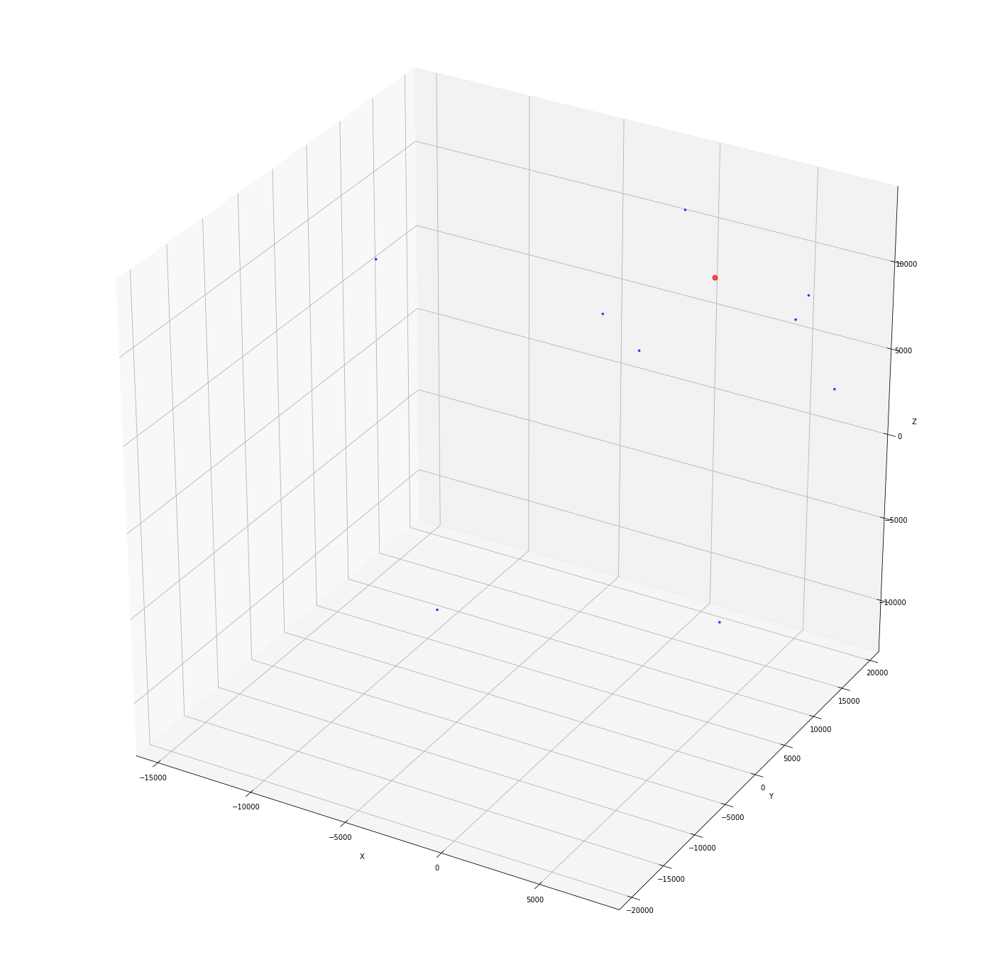

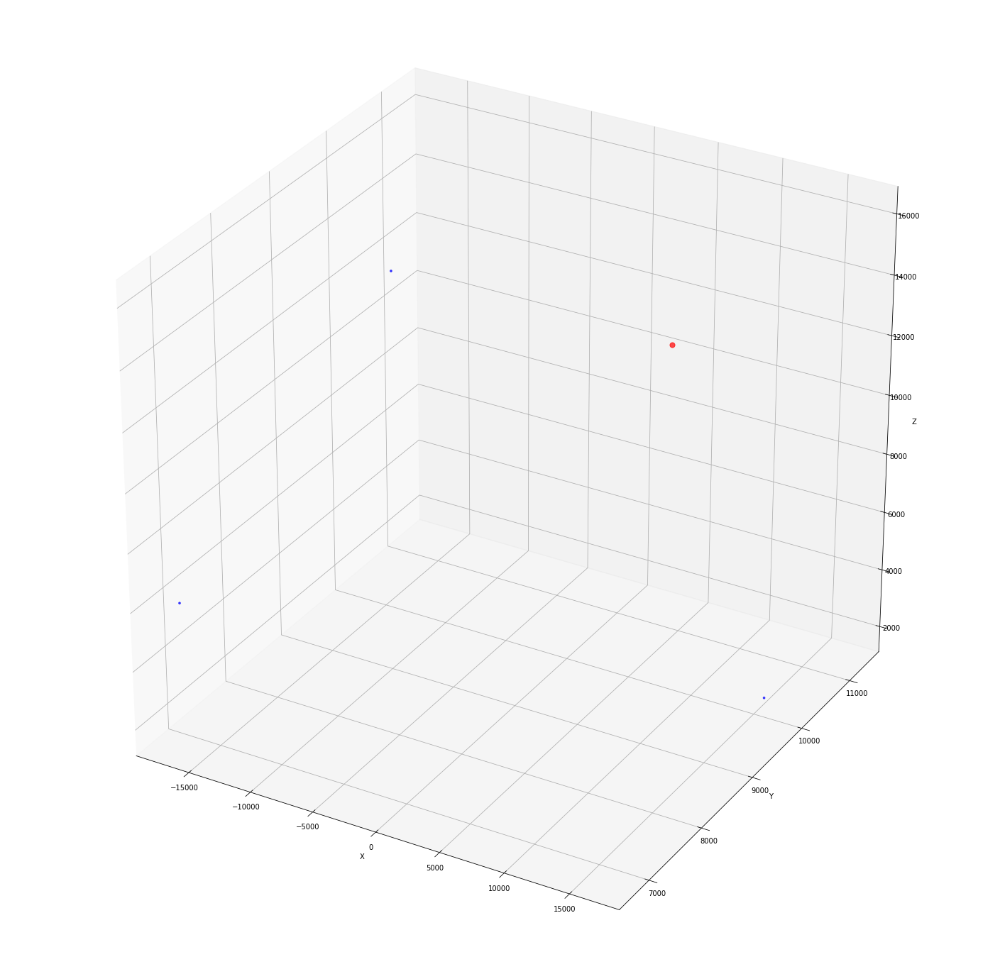

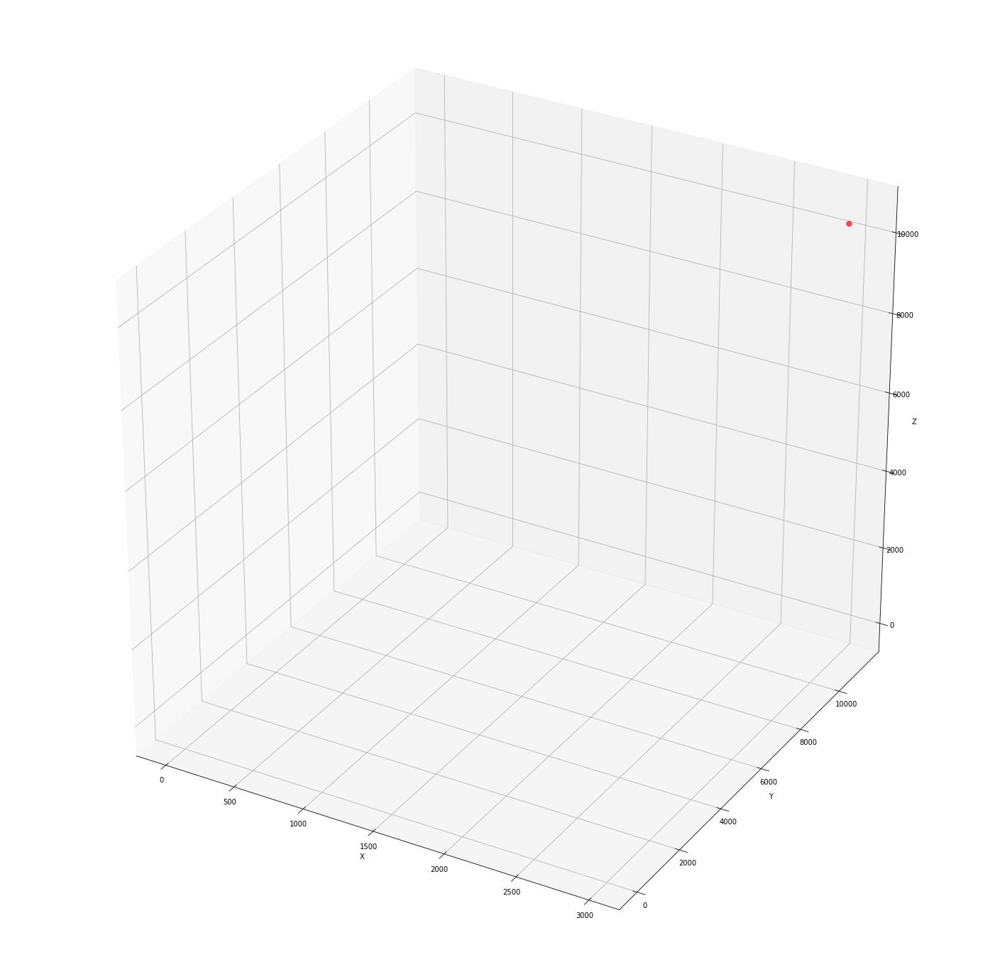

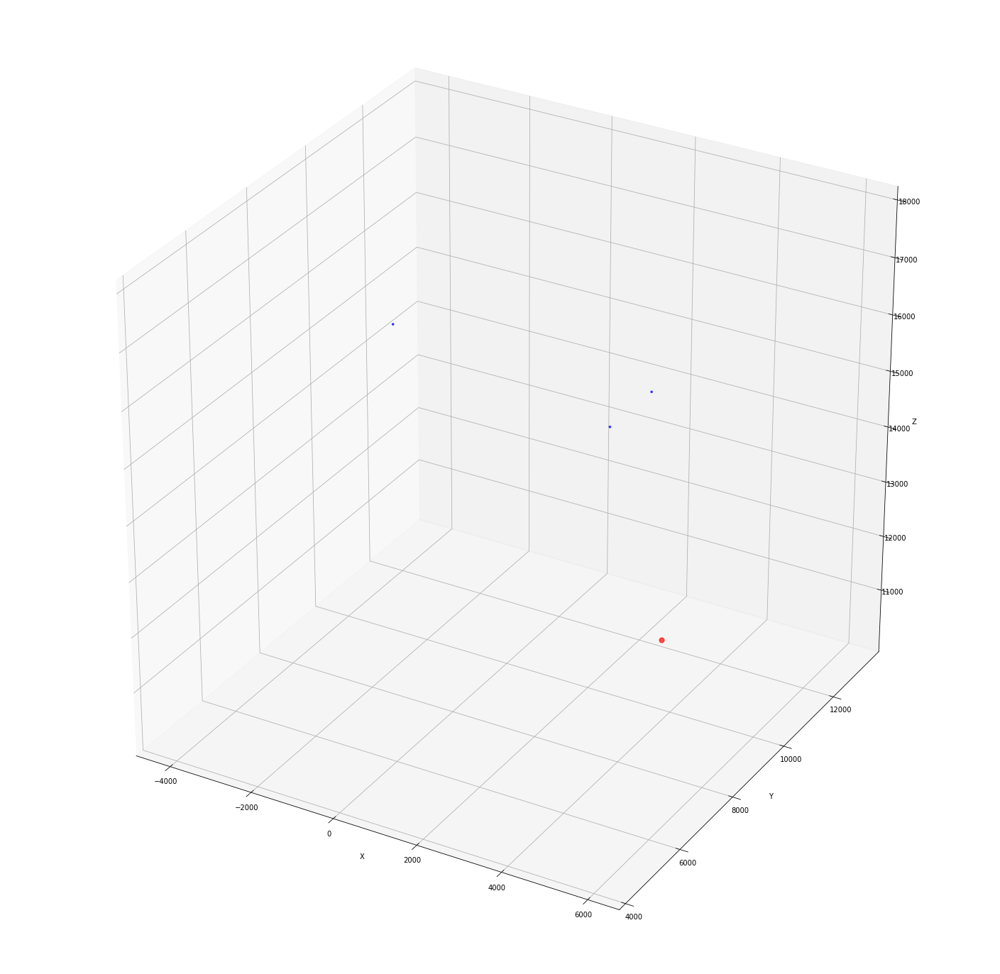

In [35]:
for i in range(n-1):
    ldf = lpmt_event_hits_without_DN[(lpmt_event_hits_without_DN['hitTime'] >= time_ints[i])
                                     & (lpmt_event_hits_without_DN['hitTime'] < time_ints[i+1])] 
    sdf = spmt_event_hits_without_DN[(spmt_event_hits_without_DN['hitTime'] >= time_ints[i])
                                     & (spmt_event_hits_without_DN['hitTime'] < time_ints[i+1])]
    
    l_hits = ldf['pmtID'].values
    s_hits = sdf['pmtID'].values
    
    if (l_hits.size < 200 & s_hits.size < 200): 
        break
        
    x = []
    y = []
    z = []
    
    for t in lpmt_pos.itertuples():
        if t[1] in l_hits:
            x.append(t[2])
            y.append(t[3])
            z.append(t[4])
        
    for t in spmt_pos.itertuples():
        if t[1] in s_hits:
            x.append(t[2])
            y.append(t[3])
            z.append(t[4])
    
    fig = plt.figure(figsize=(25, 25))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(x, y, z, c='b', marker='o', s=7, alpha=0.7)
    
    ax.scatter(true_event[0], true_event[1], true_event[2], c='r', marker='o', s=50, alpha=0.7)


    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    #plt.show()

In [28]:
from ipywidgets import Button, Layout

%matplotlib inline
from ipywidgets import interactive
import matplotlib.pyplot as plt
import numpy as np

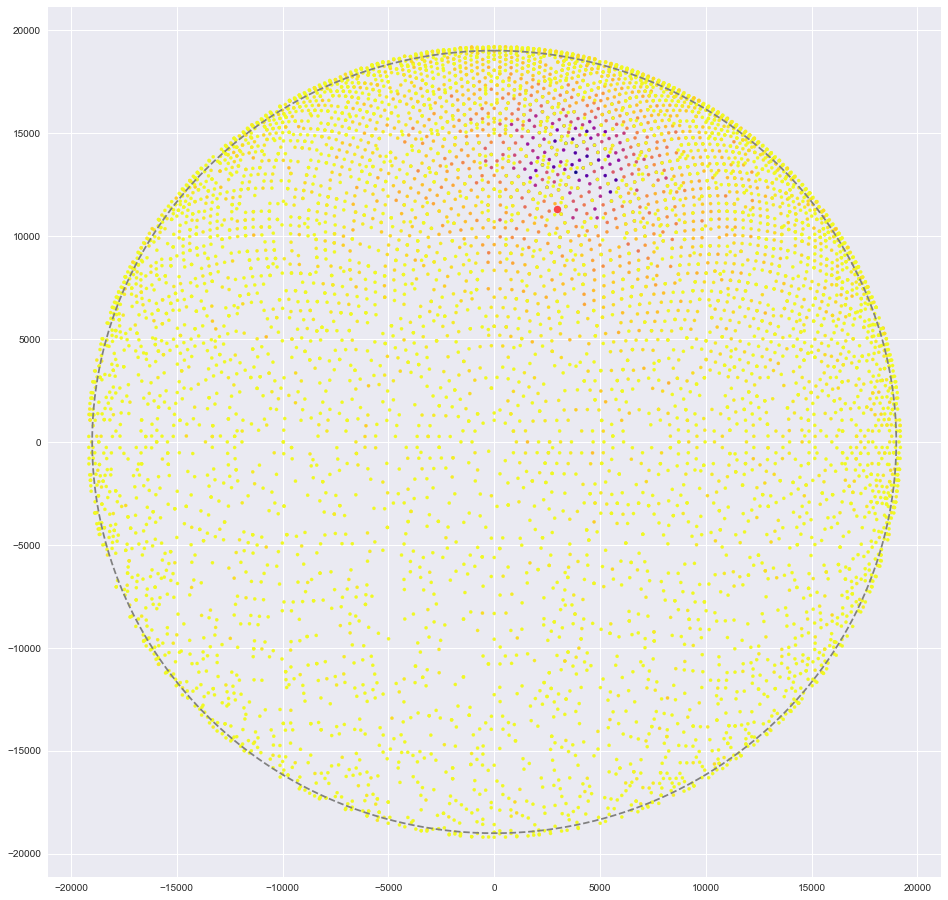

In [29]:
def rotate(data, r0, r1):
    a1 = r0 * np.pi
    
    data = np.dot(np.array(
        [[1,          0,           0],
         [0, np.cos(a1), -np.sin(a1)],
         [0, np.sin(a1),  np.cos(a1)]]
        
    ), data)
    
    a2 = r1 * np.pi
    
    data = np.dot(np.array(
        [[ np.cos(a2), 0,  np.sin(a2)],
         [          0, 1,           0],
         [-np.sin(a2), 0,  np.cos(a2)]]
        
    ), data)

    return data

def genrate_equator():
    data = np.zeros((3, 1001))
    
    r = 19000.0
    
    for i in range(1001):
        a = i / 1000 * 2 * np.pi
        data[0, i] = np.sin(a) * r
        data[1, i] = np.cos(a) * r

    return data

def genrate_equator2():
    data = np.zeros((3, 1001))
    
    r = 19000.0
    
    for i in range(1001):
        a = i / 1000 * 2 * np.pi
        data[0, i] = np.sin(a) * r
        data[2, i] = np.cos(a) * r

    return data

def f(t0, t1, r0, r1):    
    ldf = lpmt_event_hits_without_DN
    sdf = spmt_event_hits_without_DN
        
    l_hits = ldf['pmtID'].values
    s_hits = sdf['pmtID'].values
    
    un1, c1 = np.unique(l_hits, return_counts=True)
    l_hits_dict = dict(zip(un1, c1))

    un2, c2 = np.unique(s_hits, return_counts=True)
    s_hits_dict = dict(zip(un2, c2))
    
    mask = (lpmt_event_hits_without_DN['hitTime'] >= t0) & (lpmt_event_hits_without_DN['hitTime'] <= t1)
     
    color = []
    x = []
    y = []
    z = []
    
    ldf = ldf[mask]
    sdf = sdf[mask]
    
    l_hits = ldf['pmtID'].values
    s_hits = sdf['pmtID'].values
    
    for t in lpmt_pos.itertuples():
        if t[1] in l_hits:
            x.append(t[2])
            y.append(t[3])
            z.append(t[4])
            color.append(-l_hits_dict[t[1]])
        
    for t in spmt_pos.itertuples():
        if t[1] in s_hits:
            x.append(t[2])
            y.append(t[3])
            z.append(t[4])
            color.append(-s_hits_dict[t[1]])

            
    data = np.stack([x, y, z], axis=0)
    
    data = rotate(data, r0, r1)
    
    fig = plt.figure(figsize=(16, 16))
    ax = fig.add_subplot(111)
    ax.scatter(data[0], data[1], c=color, marker='o', s=10, cmap=plt.get_cmap('plasma'))
    
    
    te = np.array([true_event[0], true_event[1], true_event[2]])
    
    te = rotate(te, r0, r1)
    
    ax.scatter(te[0], te[1], c='r', marker='o', s=50, alpha=0.7)

    eq = genrate_equator()
    
    eq = rotate(eq, r0, r1)
    
    ax.plot(eq[0], eq[1], 'r--', c=(0.5, 0.5, 0.5))

    
interactive_plot = interactive(f, 
                               t0= widgets.FloatSlider(min=min(lpmt_time),max=max(lpmt_time),value=min(lpmt_time),
                                                     layout=Layout(width='80%')), 
                               t1= widgets.FloatSlider(min=min(lpmt_time),max=max(lpmt_time),value=max(lpmt_time),
                                                     layout=Layout(width='80%')), 
                               r0 = widgets.FloatSlider(min=-1,max=1,value=0, step=0.01,
                                                     layout=Layout(width='80%')), 
                               r1 = widgets.FloatSlider(min=-1,max=1,value=0, step=0.01,
                                                     layout=Layout(width='80%')))
output = interactive_plot.children[-1]
output.layout.height = '750px'
interactive_plot
